# Dask_Rapids - Small Dataset

**Summary of this Notebook:**

This notebook report presents a comprehensive benchmarking study using **RAPIDS** with **cuDF** and **Dask**, focusing on typical data processing operations such as aggregations, arithmetic computations, groupby statistics, and joins.

All benchmarks and profiling were performed using the **large dataset** previously created, serving as the foundation for subsequent reports on medium and large datasets.

Benchmarks were first executed on the **full dataset**, followed by **filtered data** (based on tip amount), and finally on **cached data** to evaluate the impact of memory persistence.

Additionally, execution profiling using **cProfile** provided fine-grained visibility into function-level performance. The results enable a detailed comparison of performance across scenarios and lay the groundwork for choosing the most efficient processing approach in large-scale GPU-enabled pipelines.

**Environment Setup**

In [ ]:
#Verifying characteristics of GPU NVIDIA available in the system
import subprocess

result = subprocess.run(["nvidia-smi"], capture_output=True, text=True)
print(result.stdout)

Thu May 29 15:33:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 565.72                 Driver Version: 566.14         CUDA Version: 12.7     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3060 ...    On  |   00000000:01:00.0 Off |                  N/A |
| N/A   49C    P3             20W /   88W |     548MiB /   6144MiB |     19%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
#Importing RAPIDS packages and checking versions
import cudf
import cuml
import cugraph
import cuspatial
import cuxfilter
print('cudf version: %s' % cudf.__version__)
print('cuml version: %s' % cuml.__version__)
print('cugraph version: %s' % cugraph.__version__)
print('cuspatial version: %s' % cuspatial.__version__)
print('cuxfilter version: %s' % cuxfilter.__version__)


cudf version: 24.04.01
cuml version: 24.04.00
cugraph version: 24.04.00
cuspatial version: 24.04.00
cuxfilter version: 24.04.01


In [ ]:
# Importing required packages
import pandas as pd
import pyarrow
import numpy as np

# Check versions
print("pandas version:", pd.__version__)
print("pyarrow version:", pyarrow.__version__)
print("numpy version:", np.__version__)

pandas version: 2.2.1
pyarrow version: 14.0.2
numpy version: 1.26.4


**Cluster initialization with Dask**

A local Dask cluster was initialized to enable distributed task scheduling and resource management, which is especially useful when working with large-scale GPU-accelerated computations.

In [ ]:
#Cluster initialization with Dask
import time
from dask.distributed import Client, LocalCluster
import dask.dataframe as dd

**Benchmark**

The function benchmark() was defined to measure the execution time of a given operation on a DataFrame and store the duration and task name in a benchmark log.
The helper function get_results() was created to convert the collected benchmark dictionary into a structured pandas DataFrame for further analysis.

In [ ]:
def benchmark(f, df, benchmarks, name, **kwargs):
    """Benchmark the given function against the given DataFrame.

    Parameters
    ----------
    f: function to benchmark
    df: data frame
    benchmarks: container for benchmark results
    name: task name

    Returns
    -------
    Duration (in seconds) of the given operation
    """
    start_time = time.time()
    ret = f(df, **kwargs)
    benchmarks['duration'].append(time.time() - start_time)
    benchmarks['task'].append(name)
    print(f"{name} took: {benchmarks['duration'][-1]} seconds")
    return benchmarks['duration'][-1]

def get_results(benchmarks):
    """Return a pandas DataFrame containing benchmark results."""
    return pd.DataFrame.from_dict(benchmarks)

The following section starts by launching a GPU-enabled Dask cluster using LocalCUDACluster and connecting a Client to it for distributed processing.

In [ ]:
import os
import cudf
import dask_cuda
import dask_cudf
import time

In [ ]:
from dask_cuda import LocalCUDACluster
from distributed import Client, wait

# Start the local CUDA cluster (scheduler + workers)
cluster = LocalCUDACluster()

# Create a Client that connects to the cluster
client = Client(cluster)

/home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34587 instead
  warnings.warn(
/home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cuda/utils.py:170: UserWarning: Cannot get CPU affinity for device with index 0, setting default affinity
  warnings.warn(


Due to a NotImplementedError caused by the unsupported PeriodDtype in cuDF, the original Parquet file had to be read first with CPU Dask.
The problematic columns were converted to strings to ensure compatibility, and the cleaned data was saved as a new Parquet file for use with RAPIDS.

In [ ]:
# 1. Read with CPU Dask
df_cpu = dd.read_parquet('../CDLE/Samples/sample_2009_2010_large_clean.parquet')

# 2. Detect and convert PeriodDtype columns
for col in df_cpu.columns:
    if df_cpu[col].dtype.name.startswith("period"):
        df_cpu[col] = df_cpu[col].astype(str)  # Or use .dt.to_timestamp() if appropriate

# 3. Write a cleaned version of the Parquet file
pdf = df_cpu.compute()
pdf.to_parquet('Samples/large.parquet', index=False)

The cleaned Parquet file is read using dask_cudf.read_parquet, allowing RAPIDS to load the data directly into GPU memory.

In [ ]:
# Reading Parquet file using cuDF - large dataset
parquet_file = '../CDLE/Samples/large.parquet'
rapids_data = dask_cudf.read_parquet(parquet_file)

Three separate dictionaries are initialized to store benchmark results for different types of operations: general tasks, filtered operations, and cache-related benchmarks.

In [ ]:
# Initializing benchmark dictionaries
rapids_benchmarks = {
    'duration': [],  # in seconds
    'task': [],
}
rapids_benchmarks_filtered = {
    'duration': [],  # in seconds
    'task': [],
}
rapids_benchmarks_cache = {
    'duration': [],  # in seconds
    'task': [],
}

The first 10 rows of the loaded data are displayed using rapids_data.head(10) to verify successful loading.

In [ ]:
rapids_data.head(10)

,index,vendor_name,Trip_Pickup_DateTime,Trip_Dropoff_DateTime,Passenger_Count,Trip_Distance,Start_Lon,Start_Lat,End_Lon,End_Lat,Payment_Type,Fare_Amt,surcharge,Tip_Amt,Tolls_Amt,Total_Amt,pickup_date,year_month,day
0,0,CMT,2009-01-01 04:50:51,2009-01-01 04:57:58,2,1.10,-73.992557,40.725880,-73.983352,40.718691,Cash,6.2,0.0,0.0,0.00,6.20,2009-01-01 04:50:51,2009-01,1
1,1,CMT,2009-01-01 12:21:34,2009-01-01 12:22:12,3,0.00,-73.975840,40.750331,-73.975840,40.750331,Credit,45.0,0.0,5.0,9.15,59.15,2009-01-01 12:21:34,2009-01,1
2,2,CMT,2009-01-01 16:17:37,2009-01-01 16:37:43,1,3.60,-73.976593,40.751878,-73.991894,40.713904,Credit,13.3,0.0,2.0,0.00,15.30,2009-01-01 16:17:37,2009-01,1
3,3,VTS,2009-01-01 14:28:00,2009-01-01 14:35:00,2,2.52,-73.971420,40.746892,-73.948028,40.778605,CASH,8.1,0.0,0.0,0.00,8.10,2009-01-01 14:28:00,2009-01,1
4,4,CMT,2009-01-01 01:22:43,2009-01-01 01:36:47,2,3.10,-73.971475,40.787167,-73.974972,40.753623,Cash,11.4,0.0,0.0,0.00,11.40,2009-01-01 01:22:43,2009-01,1
5,5,VTS,2009-01-01 10:00:00,2009-01-01 10:05:00,5,1.34,-73.992482,40.714273,-73.982358,40.731828,CASH,5.7,0.0,0.0,0.00,5.70,2009-01-01 10:00:00,2009-01,1
6,6,VTS,2009-01-01 18:12:00,2009-01-01 18:41:00,1,16.01,-73.862790,40.769033,-74.003082,40.707855,CASH,35.7,0.0,0.0,4.15,39.85,2009-01-01 18:12:00,2009-01,1
7,7,CMT,2009-01-01 11:45:56,2009-01-01 11:51:13,1,1.10,-73.975840,40.765231,-73.960437,40.769784,Cash,5.7,0.0,0.0,0.00,5.70,2009-01-01 11:45:56,2009-01,1
8,8,CMT,2009-01-01 12:56:14,2009-01-01 13:01:59,1,1.80,-73.950169,40.779748,-73.968186,40.762466,Cash,6.5,0.0,0.0,0.00,6.50,2009-01-01 12:56:14,2009-01,1
9,9,CMT,2009-01-01 12:29:23,2009-01-01 12:40:44,1,3.50,-73.952421,40.778210,-73.990890,40.751205,Cash,10.1,0.0,0.0,0.00,10.10,2009-01-01 12:29:23,2009-01,1


A set of utility functions was implemented to perform various analytical operations on RAPIDS DataFrames, such as **basic statistics (mean, std)**, **arithmetic combinations (sum, product)**, and **distance-based calculations**.

**GroupBy operations** were also defined to compute statistics by passenger count, and the results were converted to cuDF format to enable join operations.

Lastly, two **join functions (join_count and join_data)** were included to merge the main dataset with aggregated statistics and optionally count or return the merged data.

In [ ]:
def read_file_parquet(df=None):
    return dask_cudf.read_parquet("Samples/large.parquet")

def count(df=None):
    return len(df)

def count_index_length(df=None):
    return len(df.index)

def mean(df):
    return df.Fare_Amt.mean()

def standard_deviation(df):
    return df.Fare_Amt.std()

def mean_of_sum(df):
    return (df.Fare_Amt + df.Tip_Amt).mean()

def sum_columns(df):
    x = df.Fare_Amt + df.Tip_Amt

    return x

def mean_of_product(df):
    return (df.Fare_Amt * df.Tip_Amt).mean()

def product_columns(df):
    x = df.Fare_Amt * df.Tip_Amt

    return x

def value_counts(df):
    val_counts = df.Fare_Amt.value_counts()
    return val_counts

def complicated_arithmetic_operation(df):
    theta_1 = df.Start_Lon
    phi_1 = df.Start_Lat
    theta_2 = df.End_Lon
    phi_2 = df.End_Lat
    temp = (np.sin((theta_2 - theta_1) / 2 * np.pi / 180) ** 2
           + np.cos(theta_1 * np.pi / 180) * np.cos(theta_2 * np.pi / 180) * np.sin((phi_2 - phi_1) / 2 * np.pi / 180) ** 2)
    ret = np.multiply(np.arctan2(np.sqrt(temp), np.sqrt(1-temp)),2)

    return ret

def mean_of_complicated_arithmetic_operation(df):
    theta_1 = df.Start_Lon
    phi_1 = df.Start_Lat
    theta_2 = df.End_Lon
    phi_2 = df.End_Lat
    temp = (np.sin((theta_2 - theta_1) / 2 * np.pi / 180) ** 2
           + np.cos(theta_1 * np.pi / 180) * np.cos(theta_2 * np.pi / 180) * np.sin((phi_2 - phi_1) / 2 * np.pi / 180) ** 2)
    ret = np.multiply(np.arctan2(np.sqrt(temp), np.sqrt(1-temp)),2)
    return ret.mean()

def groupby_statistics(df):
    gb = df.groupby(by='Passenger_Count').agg(
      {
        'Fare_Amt': ['mean', 'std'],
        'Tip_Amt': ['mean', 'std']
      }
    )
    return gb

#other = pd.DataFrame(groupby_statistics(rapids_data))
other = groupby_statistics(rapids_data).compute().to_pandas()
other.columns = pd.Index([e[0]+'_' + e[1] for e in other.columns.tolist()])

# Assuming other is currently a pandas DataFrame:
other = cudf.from_pandas(other)

def join_count(df, other):
    merged = df.merge(other, left_index=True, right_index=True)
    # force computation here to get a concrete dataframe
    merged_df = merged.compute()
    return len(merged_df)


def join_data(df, other):
    #ret = df.merge(other.spark.hint("broadcast"), left_index=True, right_index=True)
    ret = df.merge(other, left_index=True, right_index=True)

    return ret

A complete benchmark was executed using RAPIDS to evaluate the performance of the previously defined operations.
Each function was timed using the benchmark() utility to measure its execution duration on the GPU-accelerated DataFrame.

These results provide a foundation for objective performance comparisons in the subsequent benchmarking section.

In [ ]:
benchmark(read_file_parquet, df=None, benchmarks=rapids_benchmarks, name='read file')
benchmark(count, df=rapids_data, benchmarks=rapids_benchmarks, name='count')
benchmark(count_index_length, df=rapids_data, benchmarks=rapids_benchmarks, name='count index length')
benchmark(mean, df=rapids_data, benchmarks=rapids_benchmarks, name='mean')
benchmark(standard_deviation, df=rapids_data, benchmarks=rapids_benchmarks, name='standard deviation')
benchmark(mean_of_sum, df=rapids_data, benchmarks=rapids_benchmarks, name='mean of columns addition')
benchmark(sum_columns, df=rapids_data, benchmarks=rapids_benchmarks, name='addition of columns')
benchmark(mean_of_product, df=rapids_data, benchmarks=rapids_benchmarks, name='mean of columns multiplication')
benchmark(product_columns, df=rapids_data, benchmarks=rapids_benchmarks, name='multiplication of columns')
benchmark(value_counts, df=rapids_data, benchmarks=rapids_benchmarks, name='value counts')
benchmark(mean_of_complicated_arithmetic_operation, df=rapids_data, benchmarks=rapids_benchmarks, name='mean of complex arithmetic ops')
benchmark(complicated_arithmetic_operation, df=rapids_data, benchmarks=rapids_benchmarks, name='complex arithmetic ops')
benchmark(groupby_statistics, df=rapids_data, benchmarks=rapids_benchmarks, name='groupby statistics')
benchmark(join_count, df=rapids_data, benchmarks=rapids_benchmarks, name='join count', other=other)
benchmark(join_data, df=rapids_data, benchmarks=rapids_benchmarks, name='join', other=other)

read file took: 0.034682512283325195 seconds
count took: 0.1136331558227539 seconds
count index length took: 0.3290588855743408 seconds
mean took: 0.006375551223754883 seconds
standard deviation took: 0.03397202491760254 seconds
mean of columns addition took: 0.014741897583007812 seconds
addition of columns took: 0.004835844039916992 seconds
mean of columns multiplication took: 0.010716438293457031 seconds
multiplication of columns took: 0.004208564758300781 seconds
value counts took: 0.0018639564514160156 seconds
mean of complex arithmetic ops took: 0.06313180923461914 seconds
complex arithmetic ops took: 0.05578970909118652 seconds
groupby statistics took: 0.03787994384765625 seconds
join count took: 0.7144160270690918 seconds
join took: 0.05035591125488281 seconds


0.05035591125488281

This part retrieves the benchmark results, removes duplicate entries based on the task name, and sets the task as the index. Then, it prints the results and saves the DataFrame in Parquet format to the specified file path, confirming the save operation.

In [ ]:
# Get benchmark results and remove duplicate tasks
rapids_res_temp = get_results(rapids_benchmarks).drop_duplicates(subset='task').set_index('task')

# Print the resulting DataFrame
print(rapids_res_temp)

# Define the filename or directory path
filename = 'Results_L/rapids_local_large'

# Save the DataFrame in Parquet format
rapids_res_temp.to_parquet(filename)

print(f'The Parquet was saved in {filename}.')

                                duration
task                                    
read file                       0.034683
count                           0.113633
count index length              0.329059
mean                            0.006376
standard deviation              0.033972
mean of columns addition        0.014742
addition of columns             0.004836
mean of columns multiplication  0.010716
multiplication of columns       0.004209
value counts                    0.001864
mean of complex arithmetic ops  0.063132
complex arithmetic ops          0.055790
groupby statistics              0.037880
join count                      0.714416
join                            0.050356
The Parquet was saved in Results_L/rapids_local_large.


## cProfile

In this next section, a benchmarking function its defined in order to, not only measure the execution time but also profile the function’s performance using Python’s built-in **cProfile module**.

The profiling collects detailed statistics about function calls, such as how many times each function was called and the time spent cumulatively. This helps identify bottlenecks and optimize code performance beyond just timing.

In [ ]:
import cProfile
import matplotlib.pyplot as plt
from io import StringIO
import pstats

The function **benchmark_cprofile** runs the target function while profiling, prints the top 25 cumulative time-consuming calls to the terminal, and optionally saves profiling data for further analysis or visualization. This approach provides both timing and detailed insight into where time is spent inside the function.

The subsequent calls to benchmark_cprofile apply this profiling to all previously defined data operations, allowing comprehensive performance evaluation of each step on the GPU-accelerated RAPIDS dataframe.

In [ ]:
def benchmark_cprofile(f, df, benchmarks, name, profile_data=None, **kwargs):
    """Benchmark and profile execution of a function using cProfile (without IO)."""
    pr = cProfile.Profile()
    pr.enable()

    start_time = time.time()
    ret = f(df, **kwargs)
    duration = time.time() - start_time

    pr.disable()

    benchmarks['duration'].append(duration)
    benchmarks['task'].append(name)
    print(f"{name} took: {duration:.4f} seconds")

    # Print profiling stats in terminal, sorted by cumulative time
    ps = pstats.Stats(pr)
    ps.sort_stats(pstats.SortKey.CUMULATIVE)
    ps.print_stats(25)

    # Save profiling stats for later visualization or analysis
    if profile_data is not None:
        stats_data = []
        for func, stat in ps.stats.items():
            filename, lineno, function = func
            ncalls, _, percall, cumtime, _ = stat
            stats_data.append({
                'task': name,
                'function': f"{filename}:{lineno} ({function})",
                'percall': percall,
                'cumtime': cumtime,
                'ncalls': ncalls
            })
        profile_data.append(pd.DataFrame(stats_data))

    return duration

In [ ]:
# Dictionaries to store benchmark durations and profiling data
rapids_benchmarks_cprofile = {'duration': [], 'task': []}
rapids_profile_data = []

# Run benchmark + profiling on each function
benchmark_cprofile(read_file_parquet, df=None, benchmarks=rapids_benchmarks_cprofile, name='read file', profile_data=rapids_profile_data)
benchmark_cprofile(count, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='count', profile_data=rapids_profile_data)
benchmark_cprofile(count_index_length, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='count index length', profile_data=rapids_profile_data)
benchmark_cprofile(mean, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='mean', profile_data=rapids_profile_data)
benchmark_cprofile(standard_deviation, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='standard deviation', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_sum, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='mean of columns addition', profile_data=rapids_profile_data)
benchmark_cprofile(sum_columns, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='addition of columns', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_product, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='mean of columns multiplication', profile_data=rapids_profile_data)
benchmark_cprofile(product_columns, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='multiplication of columns', profile_data=rapids_profile_data)
benchmark_cprofile(value_counts, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='value counts', profile_data=rapids_profile_data)
benchmark_cprofile(complicated_arithmetic_operation, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_complicated_arithmetic_operation, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='mean of complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(groupby_statistics, df=rapids_data, benchmarks=rapids_benchmarks_cprofile, name='groupby statistics', profile_data=rapids_profile_data)
benchmark_cprofile(join_count, rapids_data, benchmarks=rapids_benchmarks_cprofile, name='join count', other=other, profile_data=rapids_profile_data)
benchmark_cprofile(join_data, rapids_data, benchmarks=rapids_benchmarks_cprofile, name='join', other=other, profile_data=rapids_profile_data)

read file took: 0.0364 seconds
         21201 function calls (20488 primitive calls) in 0.036 seconds

   Ordered by: cumulative time
   List reduced from 721 to 25 due to restriction <25>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000    0.036    0.036 /tmp/ipykernel_6811/1614305758.py:1(read_file_parquet)
        1    0.000    0.000    0.036    0.036 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/__init__.py:36(read_parquet)
      2/1    0.000    0.000    0.036    0.036 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask/backends.py:137(wrapper)
        1    0.000    0.000    0.036    0.036 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:599(read_parquet)
        1    0.000    0.000    0.036    0.036 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:504(_default_backend)
    

0.0838174819946289

In [ ]:
# Concatenating all DataFrames
df_profile_all = pd.concat(rapids_profile_data, ignore_index=True)

The **plot_profile_per_task function** generates detailed bar plots showing the slowest internal functions (based on profiling) for each operation that was benchmarked.

The plotted graphics show:
- Each graph corresponds to one benchmarked operation (e.g., read file, count, groupby statistics, etc.).

- For each operation, the top N internal functions (typically from Python or RAPIDS/CuDF internals) are displayed.

- The Y-axis lists the function names and line numbers involved in that operation.

- The X-axis represents the chosen profiling metric:

- 'percall': Average time per individual call to the function (in seconds).

- 'cumtime': Total cumulative time spent in the function, including all subcalls.

By default, the code plots the top 25 functions with the highest percall time in each operation, highlighting where performance bottlenecks may occur inside RAPIDS or user-defined functions.

In [ ]:
def plot_profile_per_task(profile_data_list, metric='percall', top_n=10):

    for df in profile_data_list:
        task_name = df['task'].iloc[0]
        df_sorted = df.sort_values(by=metric, ascending=False).head(top_n)

        plt.figure(figsize=(12, 6))
        plt.barh(df_sorted['function'], df_sorted[metric], color='teal')
        plt.xlabel(f'{metric} (seconds)')
        plt.title(f'{task_name} - Top {top_n} funções por {metric}')
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.show()

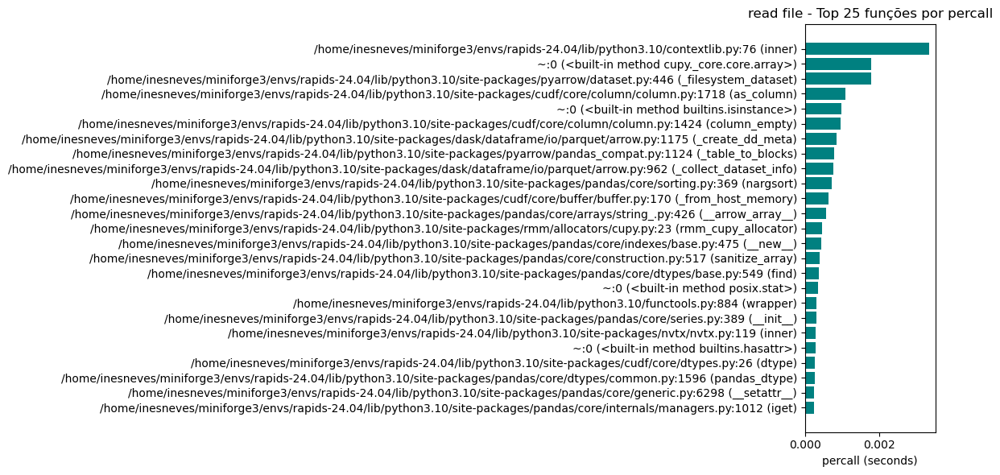

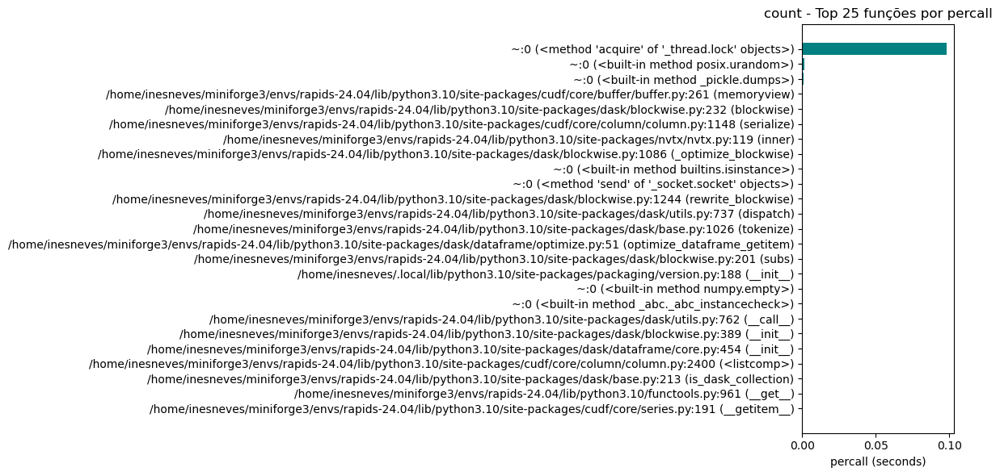

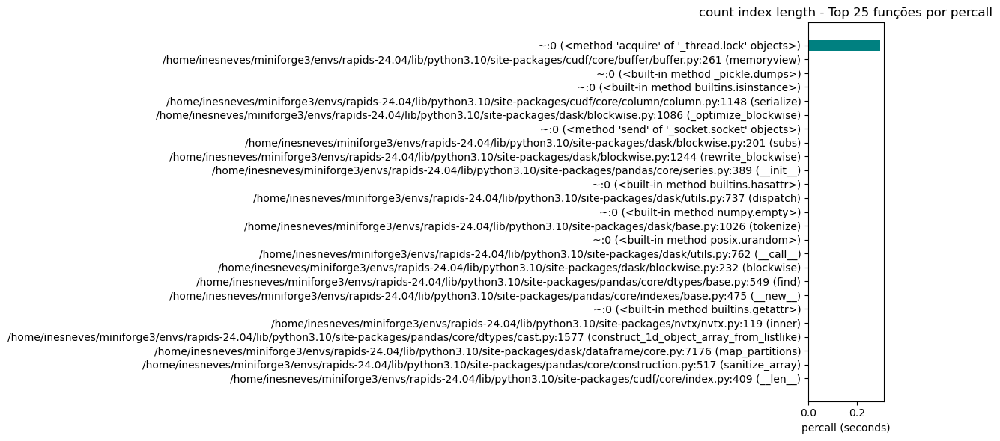

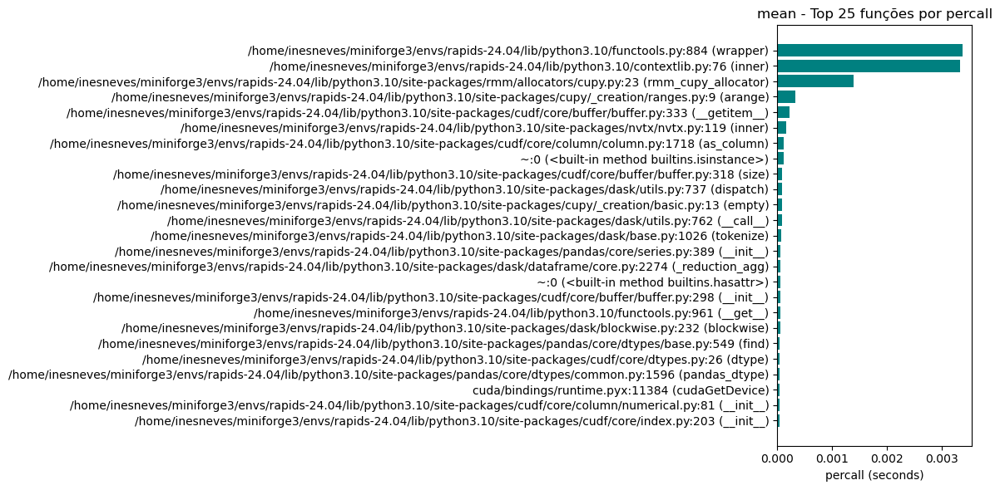

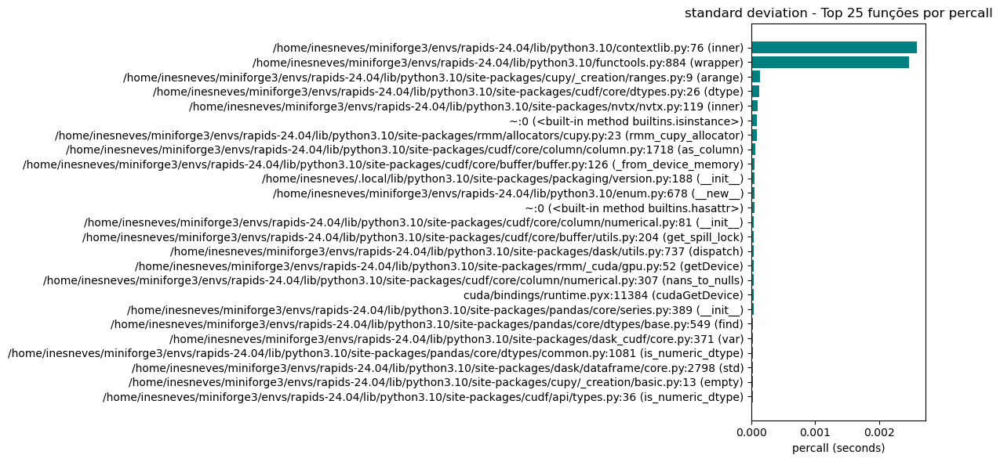

...

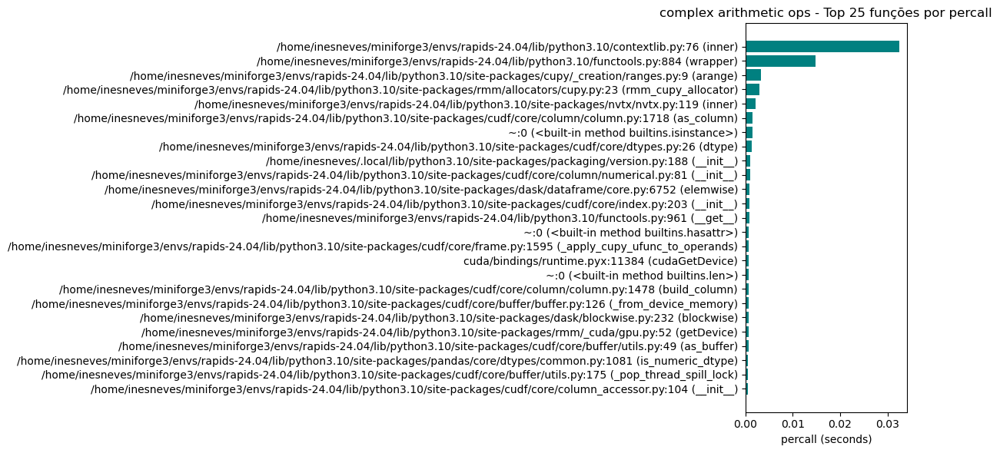

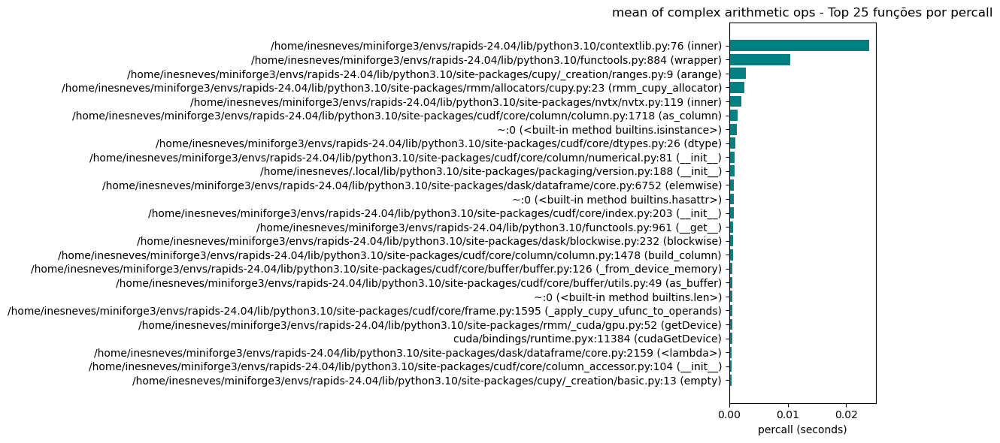

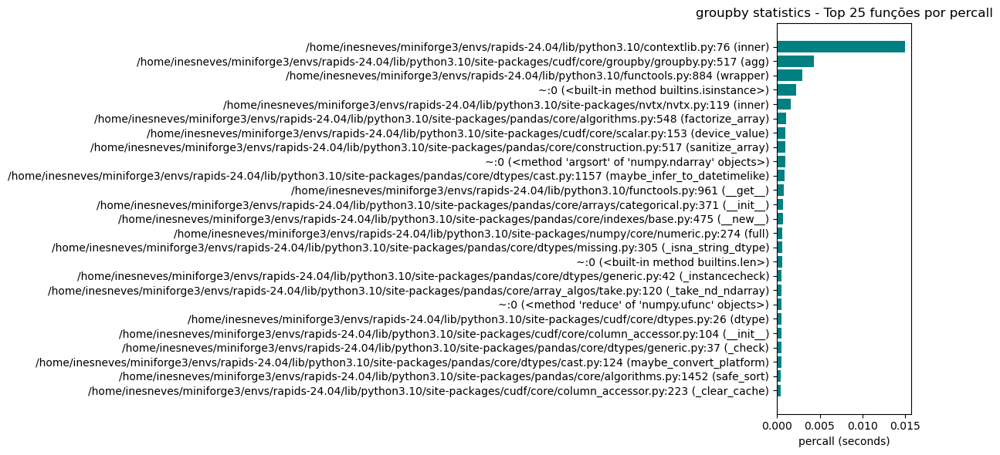

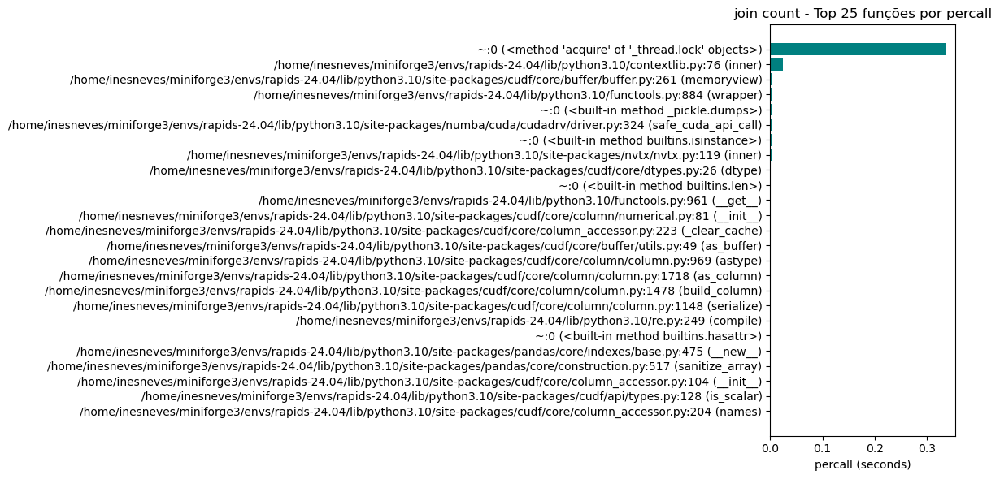

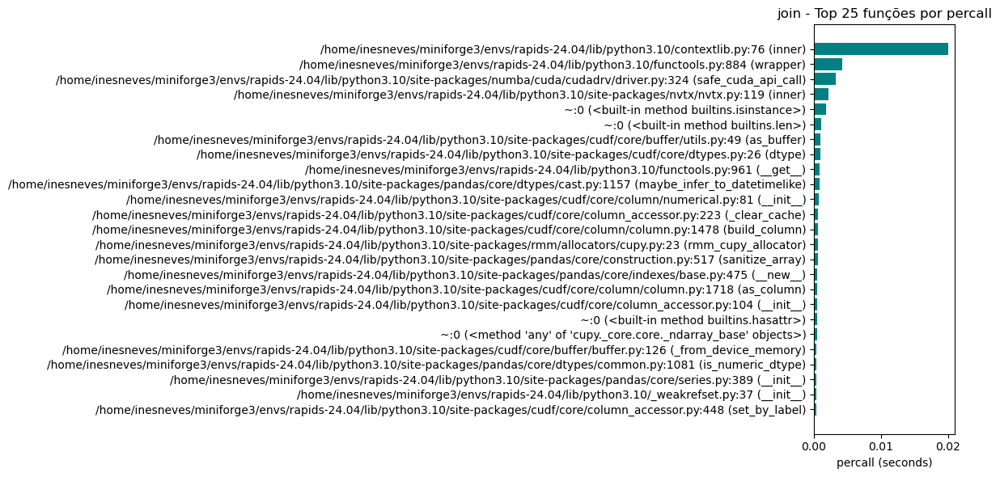

In [ ]:
plot_profile_per_task(rapids_profile_data, metric='percall', top_n=25)

**Filtered Operations**

This section applies a filter to the dataset, selecting only rows where the Tip_Amt is between 1 and 5.
All benchmark functions are then re-executed on this filtered subset to evaluate performance changes with reduced data volume.
This helps assess how well RAPIDS scales and performs under constrained data scenarios.

In [ ]:
# Filter expression for cuDF
expr_filter = (rapids_data.Tip_Amt >= 1) & (rapids_data.Tip_Amt <= 5)

def filter_data(df):
    return df[expr_filter]

rapids_filtered = filter_data(rapids_data)
print(rapids_filtered)

<dask_cudf.DataFrame | 6 tasks | 1 npartitions>


In [ ]:
benchmark(read_file_parquet, df=None, benchmarks=rapids_benchmarks_filtered, name='read file')
benchmark(count, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='count')
benchmark(count_index_length, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='count index length')
benchmark(mean, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='mean')
benchmark(standard_deviation, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='standard deviation')
benchmark(mean_of_sum, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='mean of columns addition')
benchmark(sum_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='addition of columns')
benchmark(mean_of_product, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='mean of columns multiplication')
benchmark(product_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='multiplication of columns')
benchmark(mean_of_complicated_arithmetic_operation, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='mean of complex arithmetic ops')
benchmark(complicated_arithmetic_operation, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='complex arithmetic ops')
benchmark(value_counts, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='value counts')
benchmark(groupby_statistics, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='groupby statistics')

other = groupby_statistics(rapids_filtered)
other.columns = pd.Index([e[0]+'_' + e[1] for e in other.columns.tolist()])

benchmark(join_count, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='join count', other=other)
benchmark(join_data, rapids_filtered, benchmarks=rapids_benchmarks_filtered, name='join', other=other)

read file took: 0.036786794662475586 seconds
count took: 0.1975867748260498 seconds
count index length took: 0.2810533046722412 seconds
mean took: 0.004990577697753906 seconds
standard deviation took: 0.005030393600463867 seconds
mean of columns addition took: 0.005980253219604492 seconds
addition of columns took: 0.002718687057495117 seconds
mean of columns multiplication took: 0.006403923034667969 seconds
multiplication of columns took: 0.003112316131591797 seconds
mean of complex arithmetic ops took: 0.0591278076171875 seconds
complex arithmetic ops took: 0.0534825325012207 seconds
value counts took: 0.0016367435455322266 seconds
groupby statistics took: 0.030169248580932617 seconds
join count took: 0.3722522258758545 seconds
join took: 0.04914212226867676 seconds


0.04914212226867676

In [ ]:
# Get benchmark results and remove duplicate tasks
rapids_res_filtered = get_results(rapids_benchmarks_filtered).drop_duplicates(subset='task').set_index('task')

# Print the resulting DataFrame
print(rapids_res_filtered)

# Define the filename or directory path
filename = 'Results_L/rapids_filtered_local_large'

# Save the DataFrame in Parquet format
rapids_res_filtered.to_parquet(filename)

print(f'O arquivo Parquet foi salvo em {filename}.')

                                duration
task                                    
read file                       0.036787
count                           0.197587
count index length              0.281053
mean                            0.004991
standard deviation              0.005030
mean of columns addition        0.005980
addition of columns             0.002719
mean of columns multiplication  0.006404
multiplication of columns       0.003112
mean of complex arithmetic ops  0.059128
complex arithmetic ops          0.053483
value counts                    0.001637
groupby statistics              0.030169
join count                      0.372252
join                            0.049142
O arquivo Parquet foi salvo em Results_L/rapids_filtered_local_large.


In [ ]:
rapids_benchmarks_cprofile = {'duration': [], 'task': []}
rapids_profile_data = []

benchmark_cprofile(read_file_parquet, df=None, benchmarks=rapids_benchmarks_cprofile, name='read file', profile_data=rapids_profile_data)
benchmark_cprofile(count, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='count', profile_data=rapids_profile_data)
benchmark_cprofile(count_index_length, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='count index length', profile_data=rapids_profile_data)
benchmark_cprofile(mean, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean', profile_data=rapids_profile_data)
benchmark_cprofile(standard_deviation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='standard deviation', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_sum, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of columns addition', profile_data=rapids_profile_data)
benchmark_cprofile(sum_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='addition of columns', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_product, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of columns multiplication', profile_data=rapids_profile_data)
benchmark_cprofile(product_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='multiplication of columns', profile_data=rapids_profile_data)
benchmark_cprofile(value_counts, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='value counts', profile_data=rapids_profile_data)
benchmark_cprofile(complicated_arithmetic_operation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_complicated_arithmetic_operation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(groupby_statistics, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='groupby statistics', profile_data=rapids_profile_data)
benchmark_cprofile(join_count, rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='join count', other=other, profile_data=rapids_profile_data)
benchmark_cprofile(join_data, rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='join', other=other, profile_data=rapids_profile_data)

read file took: 0.0344 seconds
         21173 function calls (20462 primitive calls) in 0.034 seconds

   Ordered by: cumulative time
   List reduced from 715 to 25 due to restriction <25>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000    0.034    0.034 /tmp/ipykernel_6811/1614305758.py:1(read_file_parquet)
        1    0.000    0.000    0.034    0.034 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/__init__.py:36(read_parquet)
      2/1    0.000    0.000    0.034    0.034 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask/backends.py:137(wrapper)
        1    0.000    0.000    0.034    0.034 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:599(read_parquet)
        1    0.000    0.000    0.034    0.034 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:504(_default_backend)
    

0.09826278686523438

In [ ]:
# Concatenating all DataFrames
df_profile_all = pd.concat(rapids_profile_data, ignore_index=True)

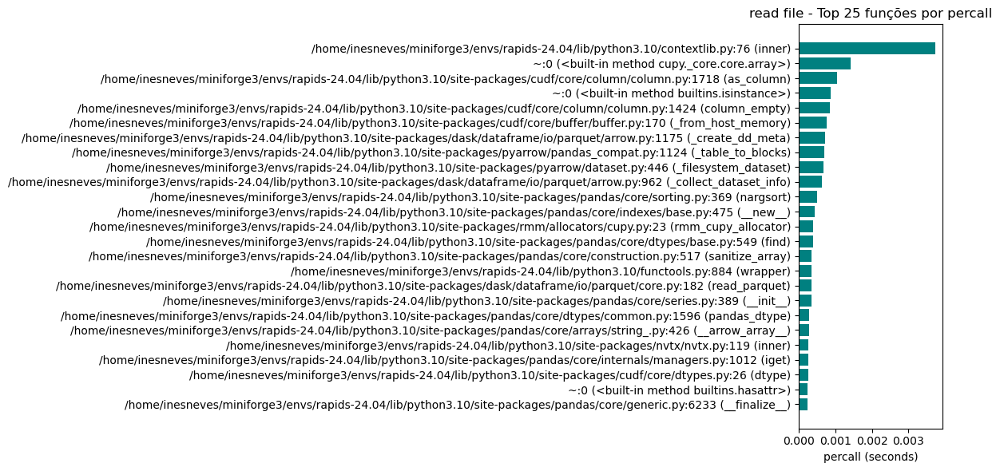

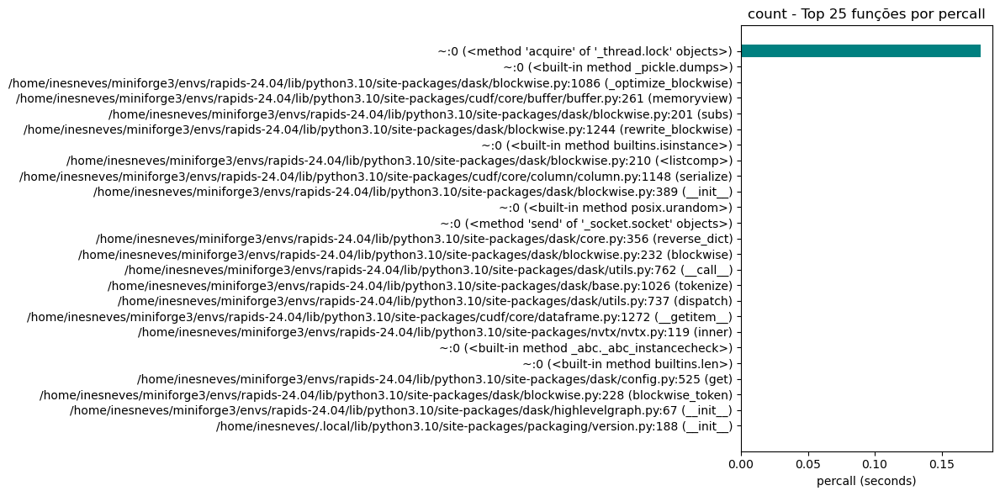

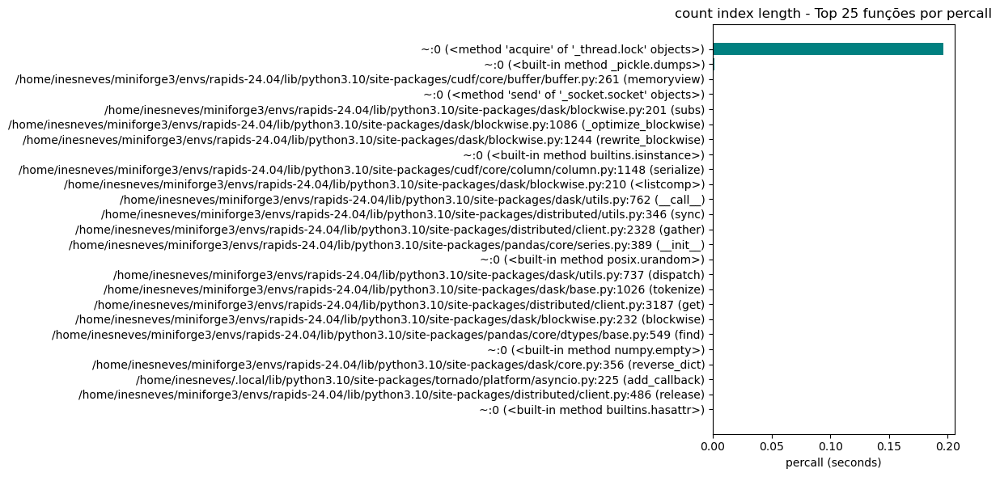

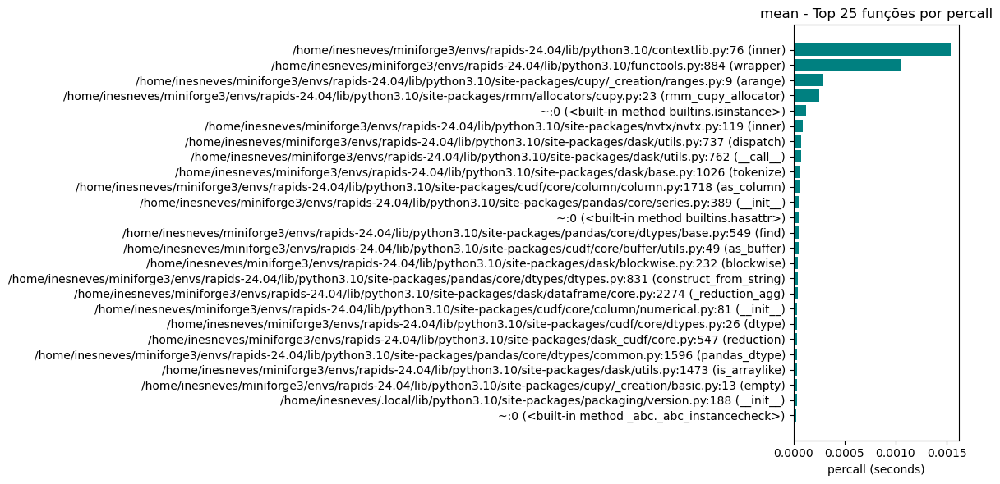

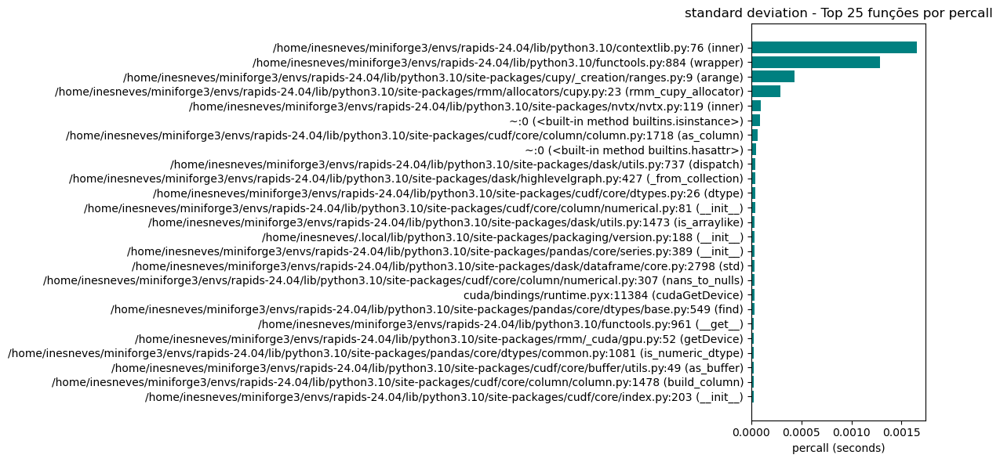

...

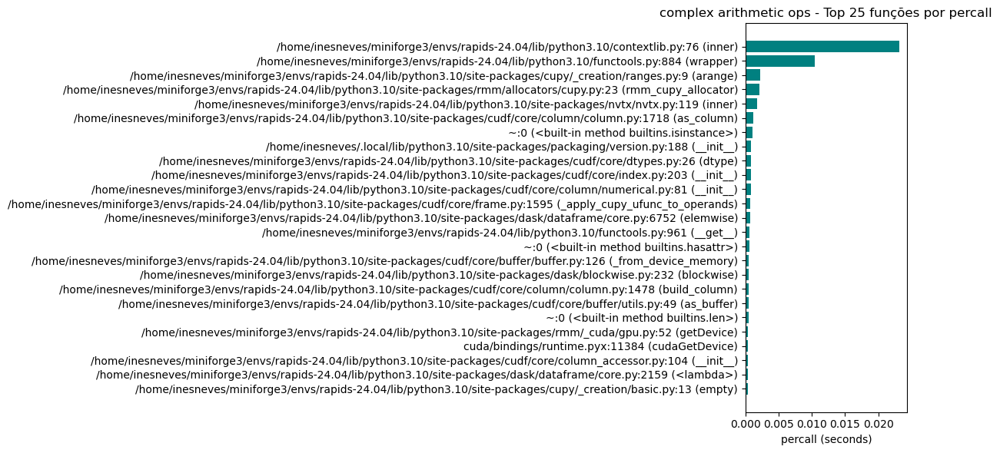

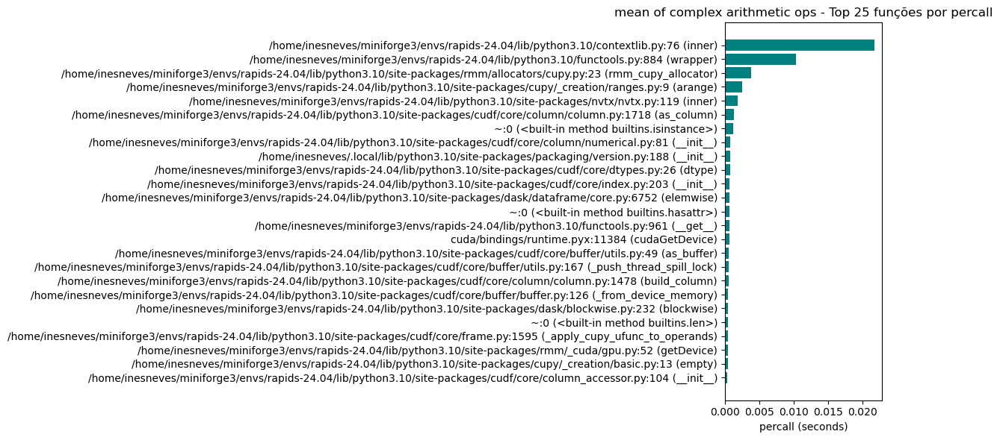

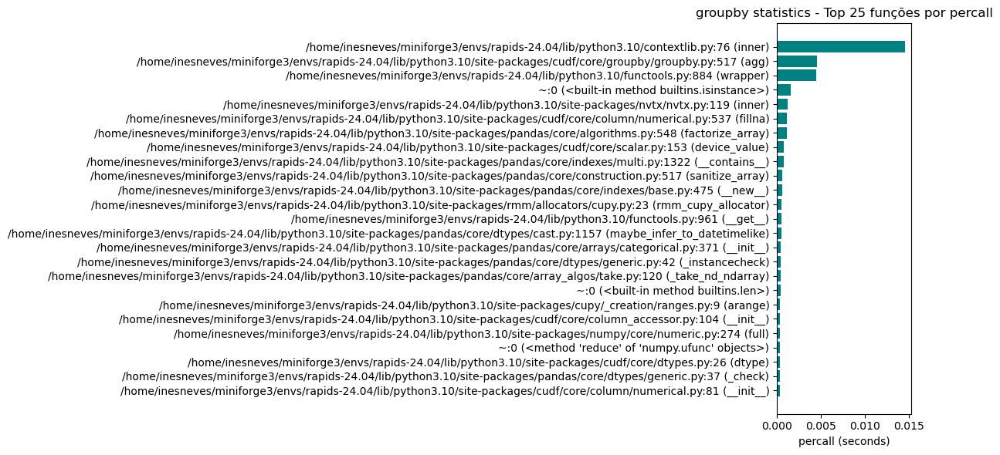

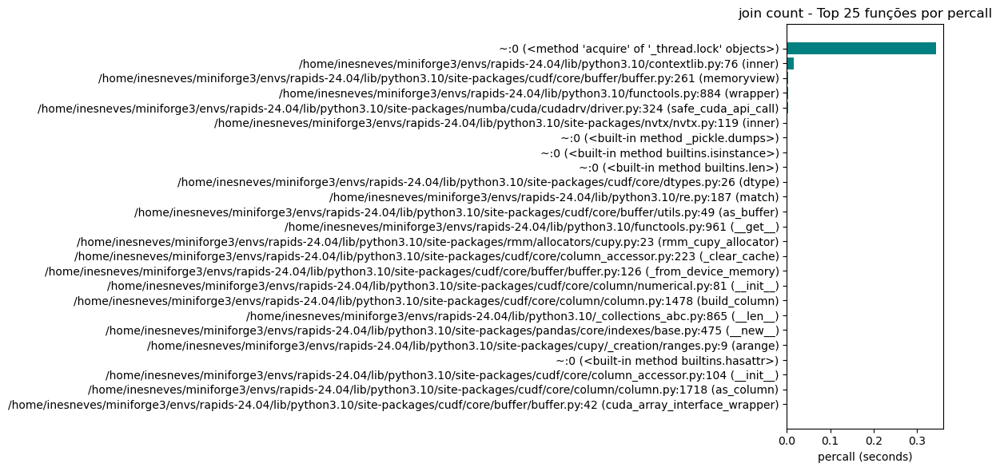

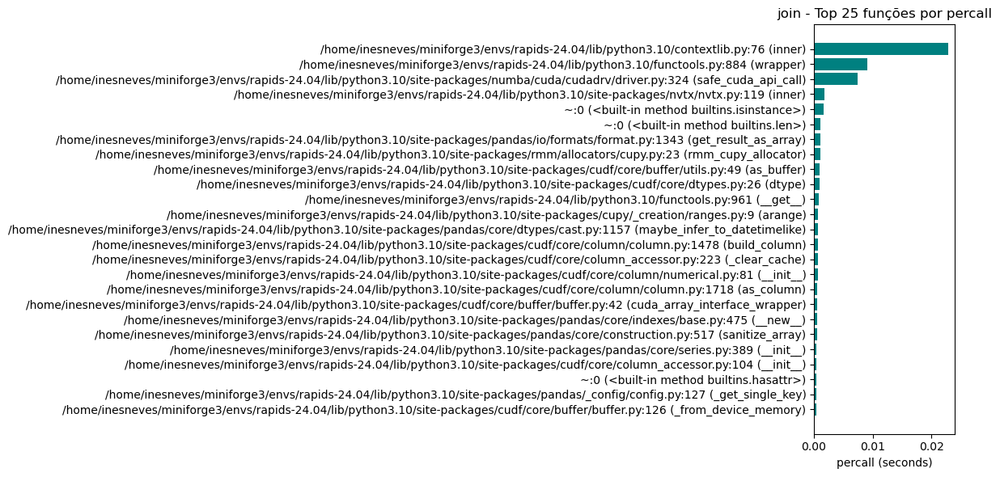

In [ ]:
plot_profile_per_task(rapids_profile_data, metric='percall', top_n=25)

**Operations with cache**

This part focuses on benchmarking cache-aware operations using RAPIDS.
The filtered DataFrame is persisted in memory with .persist(), simulating a cached environment.
The same set of benchmarks is re-executed on this cached data, and the corresponding performance plots are generated to compare improvements from caching.

In [ ]:
rapids_filtered = rapids_filtered.persist()
from distributed import wait
print('Waiting until all the futures are completed')
wait(rapids_filtered)
print('All futures have been completed')

Waiting until all the futures are completed
All futures have been completed


In [ ]:
benchmark(read_file_parquet, df=None, benchmarks=rapids_benchmarks_cache, name='read file')
benchmark(count, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='count')
benchmark(count_index_length, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='count index length')
benchmark(mean, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='mean')
benchmark(standard_deviation, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='standard deviation')
benchmark(mean_of_sum, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='mean of columns addition')
benchmark(sum_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cache, name='addition of columns')
benchmark(mean_of_product, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='mean of columns multiplication')
benchmark(product_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cache, name='multiplication of columns')
benchmark(mean_of_complicated_arithmetic_operation, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='mean of complex arithmetic ops')
benchmark(complicated_arithmetic_operation, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='complex arithmetic ops')
benchmark(value_counts, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='value counts')
benchmark(groupby_statistics, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='groupby statistics')

other = groupby_statistics(rapids_filtered)
other.columns = pd.Index([e[0]+'_' + e[1] for e in other.columns.tolist()])

benchmark(join_count, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='join count', other=other)
benchmark(join_data, rapids_filtered, benchmarks=rapids_benchmarks_cache, name='join', other=other)

read file took: 0.04847979545593262 seconds
count took: 0.02451777458190918 seconds
count index length took: 0.01641392707824707 seconds
mean took: 0.03369903564453125 seconds
standard deviation took: 0.03496074676513672 seconds
mean of columns addition took: 0.02650284767150879 seconds
addition of columns took: 0.009269475936889648 seconds
mean of columns multiplication took: 0.028801679611206055 seconds
multiplication of columns took: 0.009122133255004883 seconds
mean of complex arithmetic ops took: 0.24385595321655273 seconds
complex arithmetic ops took: 0.16284394264221191 seconds
value counts took: 0.002048015594482422 seconds
groupby statistics took: 0.035207271575927734 seconds
join count took: 0.23317861557006836 seconds
join took: 0.08407092094421387 seconds


0.08407092094421387

In [ ]:
# Get benchmark results and remove duplicate tasks
rapids_res_cache = get_results(rapids_benchmarks_cache).drop_duplicates(subset='task').set_index('task')

# Print the resulting DataFrame
print(rapids_res_cache)

# Define the filename or directory path
filename_cache = 'Results_L/rapids_cache_local_large'

# Save the DataFrame in Parquet format
rapids_res_cache.to_parquet(filename_cache)

print(f'O arquivo Parquet foi salvo em {filename_cache}.')

                                duration
task                                    
read file                       0.048480
count                           0.024518
count index length              0.016414
mean                            0.033699
standard deviation              0.034961
mean of columns addition        0.026503
addition of columns             0.009269
mean of columns multiplication  0.028802
multiplication of columns       0.009122
mean of complex arithmetic ops  0.243856
complex arithmetic ops          0.162844
value counts                    0.002048
groupby statistics              0.035207
join count                      0.233179
join                            0.084071
O arquivo Parquet foi salvo em Results_L/rapids_cache_local_large.


In [ ]:
rapids_benchmarks_cprofile = {'duration': [], 'task': []}
rapids_profile_data = []

benchmark_cprofile(read_file_parquet, df=None, benchmarks=rapids_benchmarks_cprofile, name='read file', profile_data=rapids_profile_data)
benchmark_cprofile(count, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='count', profile_data=rapids_profile_data)
benchmark_cprofile(count_index_length, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='count index length', profile_data=rapids_profile_data)
benchmark_cprofile(mean, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean', profile_data=rapids_profile_data)
benchmark_cprofile(standard_deviation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='standard deviation', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_sum, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of columns addition', profile_data=rapids_profile_data)
benchmark_cprofile(sum_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='addition of columns', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_product, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of columns multiplication', profile_data=rapids_profile_data)
benchmark_cprofile(product_columns, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='multiplication of columns', profile_data=rapids_profile_data)
benchmark_cprofile(value_counts, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='value counts', profile_data=rapids_profile_data)
benchmark_cprofile(complicated_arithmetic_operation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(mean_of_complicated_arithmetic_operation, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='mean of complex arithmetic ops', profile_data=rapids_profile_data)
benchmark_cprofile(groupby_statistics, df=rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='groupby statistics', profile_data=rapids_profile_data)
benchmark_cprofile(join_count, rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='join count', other=other, profile_data=rapids_profile_data)
benchmark_cprofile(join_data, rapids_filtered, benchmarks=rapids_benchmarks_cprofile, name='join', other=other, profile_data=rapids_profile_data)

read file took: 0.0311 seconds
         21173 function calls (20462 primitive calls) in 0.031 seconds

   Ordered by: cumulative time
   List reduced from 715 to 25 due to restriction <25>

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000    0.031    0.031 /tmp/ipykernel_6811/1614305758.py:1(read_file_parquet)
        1    0.000    0.000    0.031    0.031 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/__init__.py:36(read_parquet)
      2/1    0.000    0.000    0.031    0.031 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask/backends.py:137(wrapper)
        1    0.000    0.000    0.031    0.031 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:599(read_parquet)
        1    0.000    0.000    0.031    0.031 /home/inesneves/miniforge3/envs/rapids-24.04/lib/python3.10/site-packages/dask_cudf/backends.py:504(_default_backend)
    

0.0563504695892334

In [ ]:
# Concatenating all DatFrames
df_profile_all = pd.concat(rapids_profile_data, ignore_index=True)

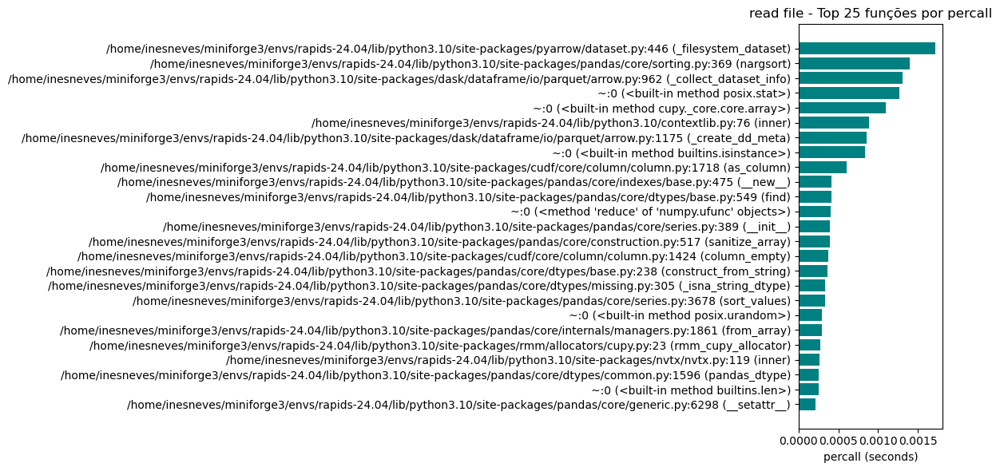

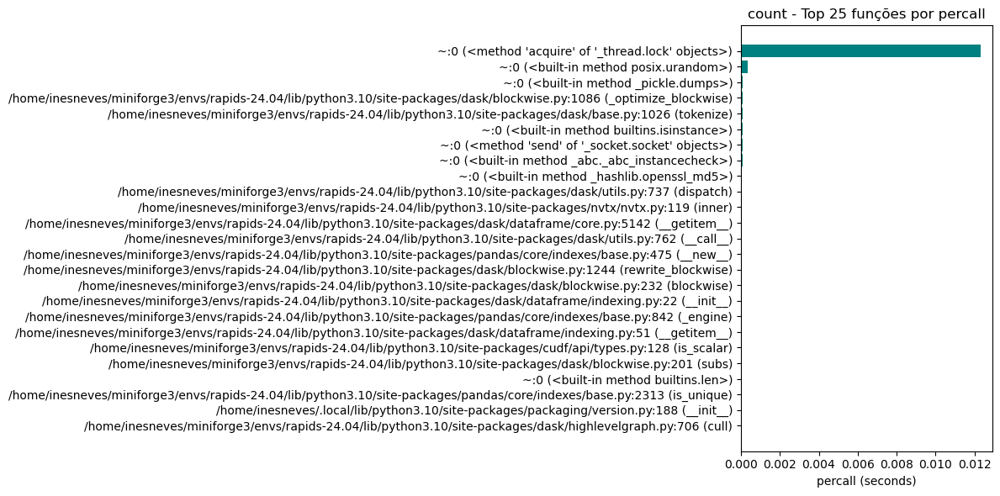

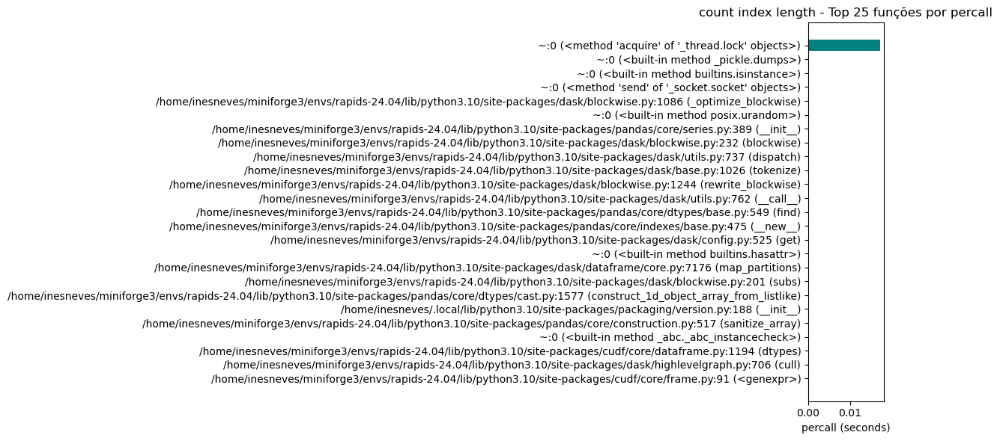

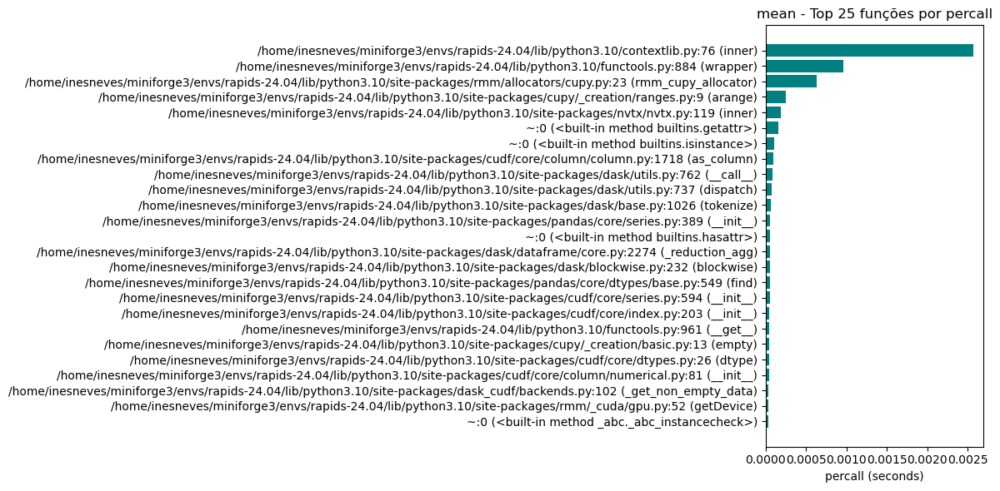

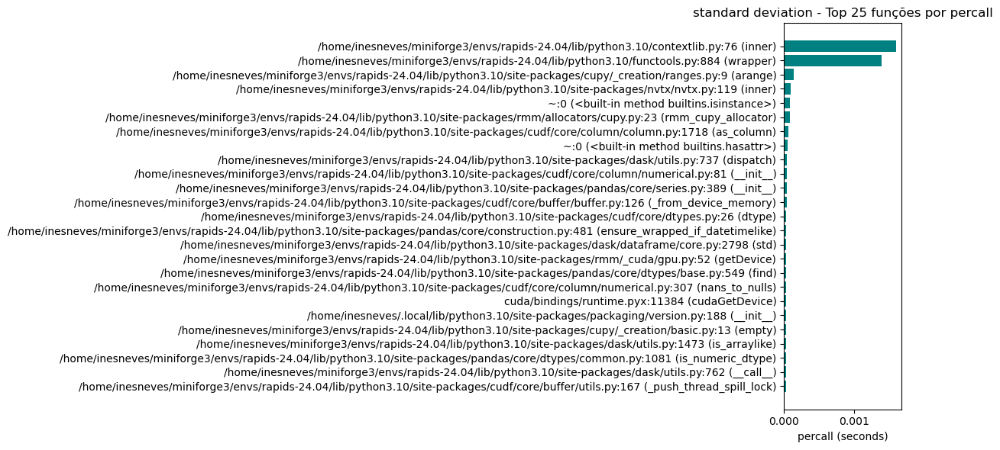

...

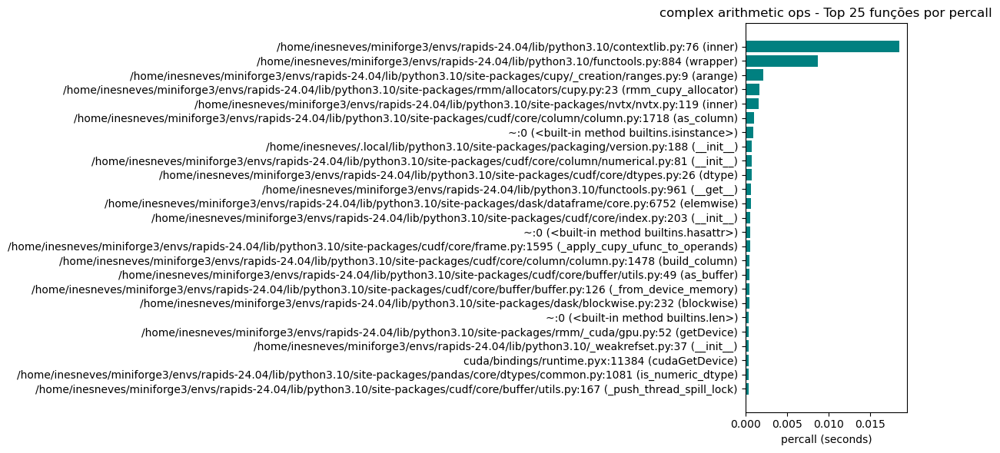

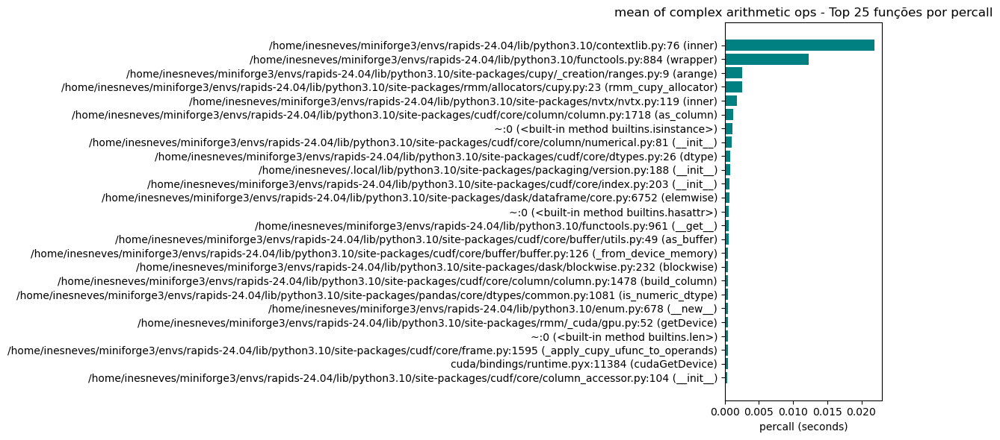

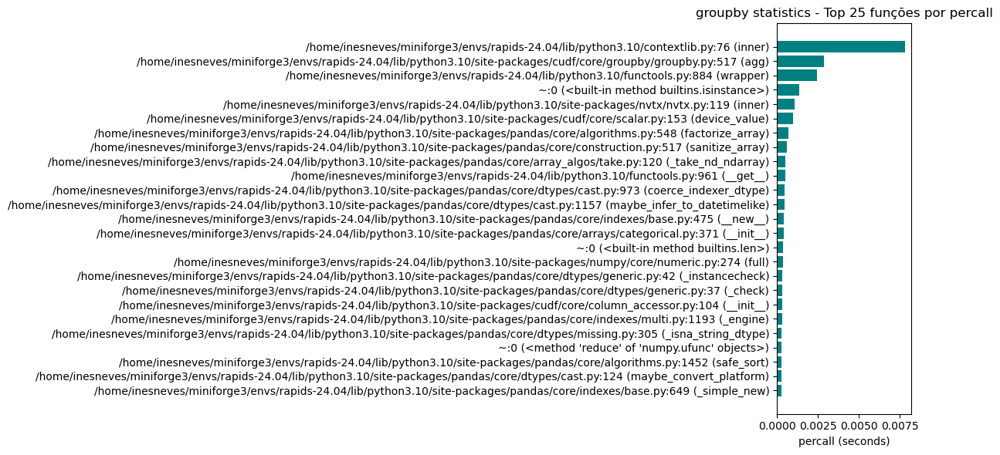

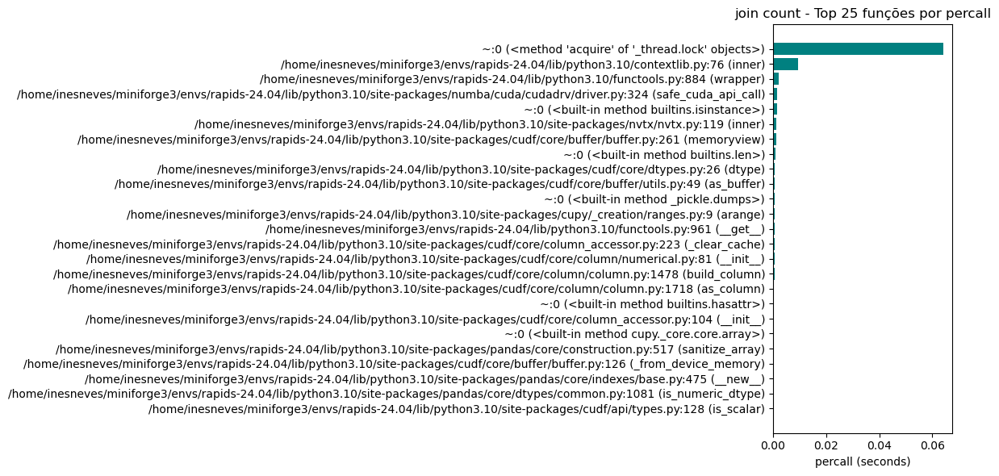

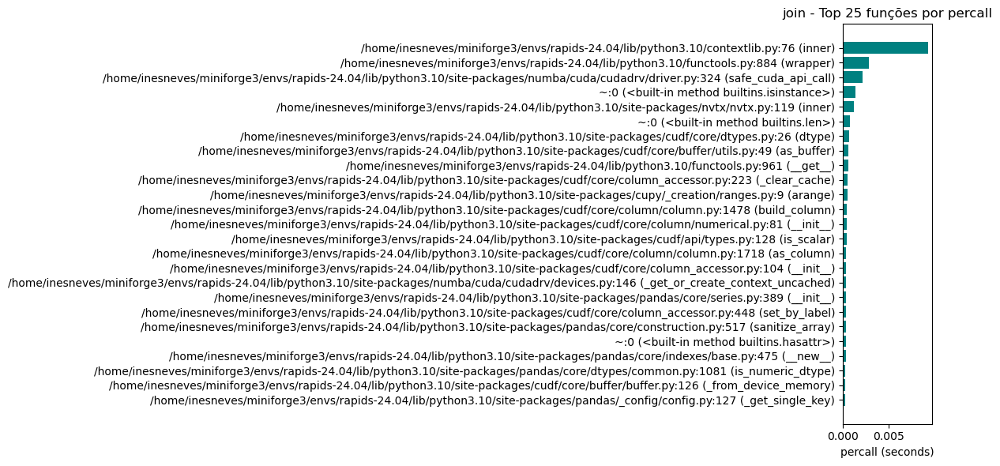

In [ ]:
plot_profile_per_task(rapids_profile_data, metric='percall', top_n=25)

To finalize, the Dask client was properly closed, ensuring the release of all allocated resources.

In [ ]:
client.close()
print("Client was closed with success")

Client was closed with success


This concludes the performance benchmarking phase using RAPIDS and Dask. Through this process, several data operations were evaluated under different conditions: full dataset, filtered subset, and cached data.